Podemos modificar nuestro modelo de regresion lineal para que clasifique los resultados en base a dos grupos (clasificacion binaria) en lugar de predecir un valor continuo.

Si nuestro modelo de regresión lineal tenía $n$ variables de entrada (y por lo tanto n pesos) podemos agregar una función que tome el resultado de la regresión lineal y devuelva 1 o 0 en base a un umbral.
##### $$\hat{y} = wrapper\_function(\sum_{i=1}^{n} w_i \cdot x_i)$$

Un ejemplo de wrapper function es la funcion sigmoide:
##### $$\sigma(x) = \frac{1}{1+e^{-x}}$$

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits import mplot3d
import seaborn as sns

In [3]:
# definamos la funcion sigmoide en python
def sigmoid(x) -> float:
	return 1/(1+np.exp(-x))

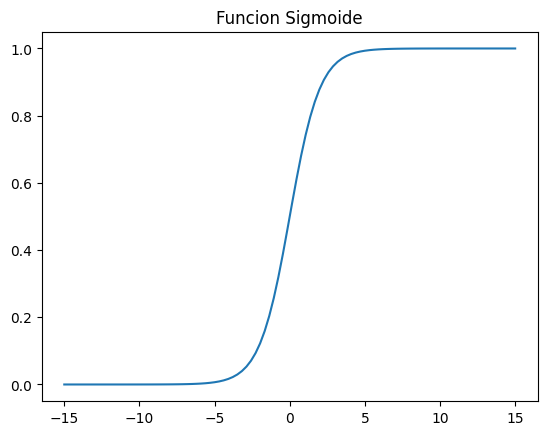

In [4]:
# graficar la funcion sigmoide en algun intervalo
x = np.linspace(-15, 15, 100)
y = sigmoid(x)
plt.plot(x, y)
plt.title('Funcion Sigmoide')
plt.show()

In [5]:
########ESTAS FUNCIONES SE USAN EN LA FASE DE ENTRENAMIENTO########
# esta era nuestra funcion de prediccion
def weighted_sum(X,w) -> np.ndarray:
	return np.matmul(X,w)

# apliquemos el sigmoide
# el proceso de mover datos procesados a traves del modelo se llama forward propagation
def forward(X,w) -> np.ndarray:
	return sigmoid(weighted_sum(X,w))

#########ESTA FUNCIÓN SE USA PARA LA FASE DE CLASIFICACIÓN###########
# como queremos que el resultado sea 1 o 0 (no un numero entre 1 y 0) redondeamos los resultados al entero mas cercano
def clasiffy(X,w) -> np.ndarray:
	return np.round(forward(X,w))

In [6]:
# definamos la funcion de perdida como antes (mean squared error)
def loss(X, Y, w) -> float:
	return np.average((forward(X,w)-Y)**2)

El problema con la función de mean squared error es que ahora ya no es suave y ademas tiene multiplos minimos locales. 

#### $$L_{mse} = \frac{1}{m} * \sum_{i=1}^{m}{(\hat{y}_i - y_i)^2}$$

La solución es definir otra funcion de error que sea suave y convexa (**log loss**).
#### $$L = -\frac{1}{m} \sum_{i=1}^{m}{(y_i * log(\hat{y}_i) + (1-y_i)*log(1-\hat{y}_i))}$$

##### Con $\hat{y}_i = \sigma(\sum_{i=1}^{n} w_i \cdot x_i)$

Para calcular el gradiente de L, tenemos que calcular las derivadas parciales de L con respecto a cada uno de los pesos $w_i$.

#### $$\frac{\partial L}{\partial w} = \frac{1}{m} \sum_{i=1}^{m}{(\hat{y_i} - y_i) \cdot x_i}$$

In [7]:
# implementemos las dos funciones
def log_loss(X,Y,w) -> float:
	y_hat = forward(X,w)
	return -np.average(Y*np.log(y_hat) + (1-Y)*np.log(1-y_hat))

def gradient(X,Y,w) -> np.ndarray:
	y_hat = forward(X,w)

	return np.matmul(X.T, (y_hat-Y)) / X.shape[0]

In [8]:
# la funcion para entrenar es igual que la anterior
def train(X, Y, iterations, lr) -> np.ndarray:
	w = np.zeros((X.shape[1], 1))

	for i in range(iterations):
		print(f'Iteration {i} => Loss: {log_loss(X, Y, w)} | W = {w.T}')
		w -= gradient(X,Y,w) * lr
	
	return w

In [9]:
# ahora carguemos los datos y entrenemos el modelo
# cada columna (x1, x2, x3, y) es un arreglo de numpy
x1, x2, x3, y = np.loadtxt('police.txt', skiprows=1, unpack=True)
# juntamos los datos en la matriz X
# la primer columna es de unos para el bias
X = np.column_stack((np.ones(x1.size), x1, x2, x3))
# redimensionamos Y para que sea un vector columna
Y = y.reshape(-1,1)

In [10]:
w = train(X,Y, 100000, 0.001)

Iteration 0 => Loss: 0.693147180559945 | W = [[0. 0. 0. 0.]]
Iteration 1 => Loss: 0.6825069292799415 | W = [[0.     0.0029 0.0017 0.0003]]
Iteration 2 => Loss: 0.6744083485767539 | W = [[-1.79534904e-05  5.51822892e-03  3.01605420e-03  5.03041740e-04]]
Iteration 3 => Loss: 0.6681067785618108 | W = [[-5.08927907e-05  7.89948493e-03  4.01097448e-03  6.25344000e-04]]
Iteration 4 => Loss: 0.6630768990056553 | W = [[-9.63136893e-05  1.00816834e-02  4.73780824e-03  6.80584678e-04]]
Iteration 5 => Loss: 0.6589497727533832 | W = [[-0.00015212  0.01209657  0.00524094  0.0006802 ]]
Iteration 6 => Loss: 0.6554665411795801 | W = [[-0.00021657  0.0139706   0.00555733  0.00063371]]
Iteration 7 => Loss: 0.6524453710797823 | W = [[-0.00028821  0.01572573  0.00571771  0.00054902]]
Iteration 8 => Loss: 0.6497582322717103 | W = [[-0.00036583  0.01738024  0.00574764  0.00043273]]
Iteration 9 => Loss: 0.6473147052019435 | W = [[-0.00044843  0.0189493   0.00566838  0.0002903 ]]
Iteration 10 => Loss: 0.64505

In [11]:
# ahora clasifiquemos los datos y comparemos con los datos reales
Y_hat = clasiffy(X,w)
muestras = X.shape[0]
correctas = np.sum(Y_hat == Y)
porcentaje = correctas/muestras * 100

for i in range(muestras):
	print(f'clasificado: {int(Y_hat[i][0])} | real: {int(Y[i][0])}')


print(f'Clasificadas correctamente: {correctas}/{muestras} ({porcentaje}%)')

clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 1 | real: 1
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 1 | real: 1
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 0 | real: 0
clasificado: 1 | real: 0
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 0 | real: 0
clasificado: 0 | real: 0
clasificado: 1 | real: 1
clasificado: 0 | real: 0
Clasificadas correctamente: 29/30 (96.66666666666667%)
